##### Introduction to Machine Learning: Supervised Learning

# **Classifying Attrition using Decision Trees and other Methods**

_______________________________________________________________________________________________________________

### **Introduction and Identifying the Problem** ##

* Attrition-- the departure of employees from an organization for any reason (voluntary or involuntary)-- can pose a significant challenge for companies aiming to retain their workforce. Predicting this behavior could influence hiring strategies and intra-company retention programs to help address these issues (ethics aside).

* In this project, HR data will be analyzed to identify underlying correlations among employees who have left the company. The goal is to determine the most accurate parameters for predicting attrition.

### **Some possible positive outcomes of this analysis could include:**

* Identifying Key Attrition Factors: What has the most consistent impact on employee turnover? 
* Predicting Employee Attrition: I.e- which employees are most likely to leave in the next year based upon this model. 
* Impoving Employee Retention: Making company adjustments based upon what is most strongly contributing to employee attrition. 
* Enhancing Employee Satisfaction: Related metrics to imoprove workplace policies and environment. 
* Influence of pay, promotions, or managers: Creating a system that motivates people to move up the ladder rather than out. 
 * Cost Management: Reducing turnover can significantly cut costs associated with hiring, training, and productivity. 


Analyzing HR data can lead to actionable insights that help organizations improve employee retention, satisfaction, and performance. By understanding the factors that contribute to employee behavior and outcomes, companies can make data-driven decisions to foster a more productive and engaged workforce.
#### This particular project will focus on building a decision tree classifer that can best predict attrition without overfitting. 


#### - The data for this project can be found here:
* https://www.kaggle.com/datasets/rishikeshkonapure/hr-analytics-prediction/data

#### **Citation:**
#### Konapure, R. (2023). HR Analytics Prediction [Data set]. Kaggle. [https://www.kaggle.com/datasets/rishikeshkonapure/hr-analytics-prediction/data]

## Step 1: Importing necessary packages for analysis
graphviz & pydotplus: for vizualing the decision trees

pandas: creating dataframes to store information

seaborn: statistical data vizualization library (for plots)

skikit-learn: powerful machine learning library for analysis

imblearn: tools to handle imbalanced datasets. 

In [ ]:
#pip install graphviz

In [1]:
#pip install pydotplus

In [12]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
#from imblearn.over_sampling import SMOTE
#import graphviz
#import pydotplus
from IPython.display import Image
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


## Step 2: Upload the data and basic cleaning

#### -The main cleaning tasks for this projct include remove some NAN values but more importantly, creating some simple Encoding mappings for efficiency when building the Decision Tree.
#### - Since this dataset comes to us rather well-maintained and clean, only a few minimal NAN values had to be removed. 

In [7]:
# Load the DataFrame
file_path = '/Users/keagandolphin/Desktop/HR-Data.csv'
df = pd.read_csv(file_path)

### 2b. Apply encoding mappings- categorical data into numeric data (for machine learning) 

In [8]:
# apply the encoding mappings
encoding_mappings = {
    'Attrition': {'No': 0, 'Yes': 1},
    'BusinessTravel': {'Non-Travel': 0, 'Travel_Rarely': 1, 'Travel_Frequently': 2},
    'Department': {'Sales': 1, 'Research & Development': 2, 'Human Resources': 3},
    'EducationField': {'Human Resources': 1, 'Life Sciences': 2, 'Marketing': 3, 'Medical': 4, 'Other': 5, 'Technical Degree': 6},
    'Gender': {'Male': 1, 'Female': 2},
    'JobRole': {
        'Healthcare Representative': 1, 'Human Resources': 2, 'Laboratory Technician': 3, 'Manager': 4,
        'Manufacturing Director': 5, 'Research Director': 6, 'Research Scientist': 7,
        'Sales Executive': 8, 'Sales Representative': 9
    },
    'MaritalStatus': {'Single': 1, 'Married': 2, 'Divorced': 3},
    'Over18': {'N': 0, 'Y': 1},
    'OverTime': {'No': 0, 'Yes': 1}
}

### 2c. Create a Correlation PLot to view relationships

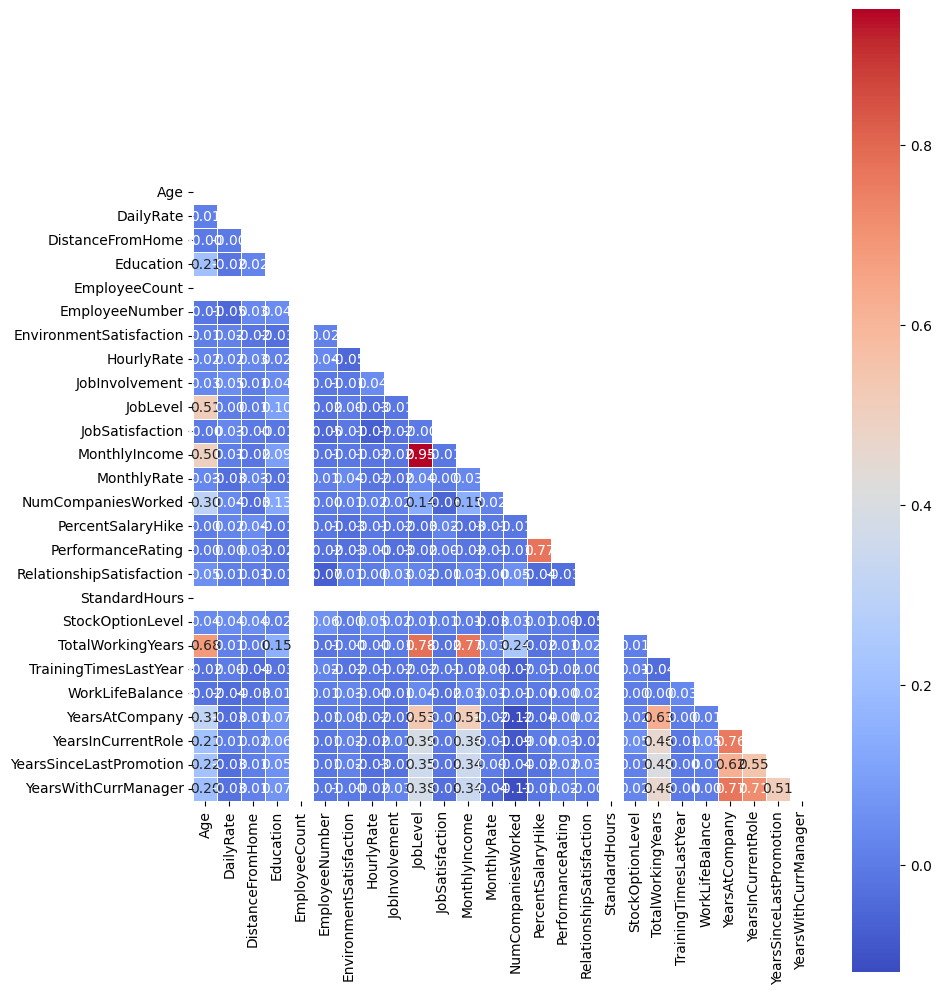

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Select only numeric columns
numeric_df = df.select_dtypes(include=[np.number])

# Calculate the correlation matrix
corr = numeric_df.corr()

# Create a mask to display only the lower triangle of the matrix
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
plt.figure(figsize=(10, 25))

# Use the 'coolwarm' colormap
cmap = sns.color_palette("coolwarm", as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, annot=True, fmt=".2f",
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

# Show the plot
plt.show()


## Step 3: Create the decision Tree

#### Decision Tree Classification was selected for this project as it creates an intuitive model that can easily be understood by those not well-versed with more complex methods. 

### Step 3a: Accounting for Class Imbalance

Since there are only 238 "Yes" Attrition values to 1471 total Attrition values (~16%), we need to account for class imbalance, or we will accidently create a ML model that is biased towards the majority class (as they will be trained to minimize overall error). This would results in high accuracy but poor performance in predicting the minority (Attrition == "Yes").  Here are two suggested counteractions:

#### **SMOTE**

* SMOTE (Synthetic Minority Over-sampling Technique) is used to address the class imbalance in the dataset. In the HR dataset, the target variable Attrition likely has an imbalanced distribution, where the number of employees who did not leave (class 0) is significantly higher than the number of employees who left (class 1). This imbalance can lead to a biased model that performs well on the majority class but poorly on the minority class.

* Improving Model Performance: By balancing the classes, SMOTE helps improve the model's ability to correctly predict the minority class, leading to better overall performance, particularly in terms of recall and F1-score for the minority class.

#### **Hyperparameter Tuning**

* Hyperparameter tuning involves selecting the best combination of hyperparameters for a machine learning model to optimize its performance. Hyperparameters are the parameters set before the learning process begins, such as the depth of a decision tree, the number of estimators in a random forest, or the learning rate in gradient boosting. 

* Improve Model Performance: Finding the optimal hyperparameters can lead to better accuracy, precision, recall, and other performance metrics.

* Prevent Overfitting/Underfitting: Proper tuning can help in finding a balance between overfitting (model too complex) and underfitting (model too simple).

### **Combining both methods**

* When dealing with imbalanced datasets, SMOTE is used to balance the classes before model training. Hyperparameter tuning can then be applied to the balanced dataset to find the optimal hyperparameters. 

- Apply SMOTE: Balance the dataset by generating synthetic samples for the minority class.
- Split the Data: Split the balanced dataset into training and testing sets.
- Hyperparameter Tuning: Use Grid Search with cross-validation on the training set to find the best hyperparameters.

--- Decision Tree ---
Accuracy: 0.90
Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.93      0.91       250
           1       0.93      0.88      0.90       244

    accuracy                           0.90       494
   macro avg       0.91      0.90      0.90       494
weighted avg       0.91      0.90      0.90       494



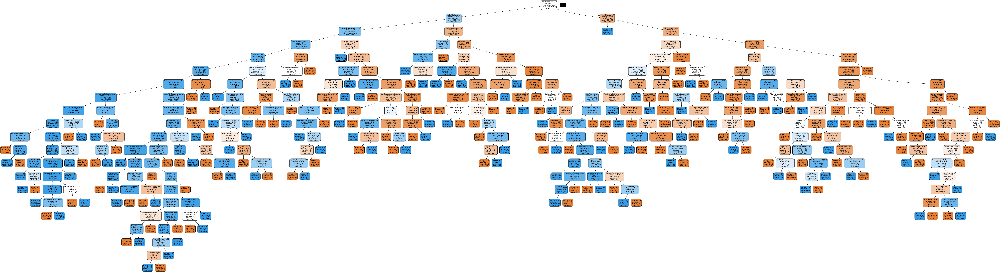

In [33]:
for column, mapping in encoding_mappings.items():
    df[column] = df[column].map(mapping)

# Prepare the data
X = df.drop('Attrition', axis=1)
y = df['Attrition']

# Apply SMOTE
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X, y)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.2, random_state=42)

# Hyperparameter tuning
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(estimator=DecisionTreeClassifier(random_state=42), param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

best_classifier = grid_search.best_estimator_

# Export the decision tree to DOT format
dot_data = export_graphviz(
    best_classifier, 
    out_file=None, 
    feature_names=X.columns, 
    class_names=['No', 'Yes'], 
    filled=True, 
    rounded=True, 
    special_characters=True
)
# Evaluate the model
print(f"--- Decision Tree ---")
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")
print("Classification Report:")
print(classification_report(y_test, y_pred))



# Create a graph from DOT data
graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())


### Above is the decision tree. In order to had a better view on this GitHub page, you can right click on the visual, "Download Image", and then zoom in on the various levels. 

## Step 3b: Observe Important Feature Comparisons

**Importance of Feature Importances:**
1. Interpretability:

* Understanding the Model: Feature importances help in understanding how the model makes decisions. By knowing which features contribute most to the predictions, you can gain insights into the model’s behavior.
* Explaining to Stakeholders: Visualizing feature importances makes it easier to explain the model's decision-making process to non-technical stakeholders, enhancing transparency and trust.

2. Feature Selection:

* Reducing Dimensionality: By identifying and selecting the most important features, you can reduce the dimensionality of the dataset, which can simplify the model and reduce overfitting.
* Improving Performance: Focusing on important features can improve model performance, especially when dealing with high-dimensional data.

3. Identifying Irrelevant Features:

* Removing Noise: Irrelevant or less important features can introduce noise into the model, leading to overfitting and poor generalization. By identifying and removing these features, you can improve the model’s robustness.

4. Insight for Business Decisions:

* Business Insights: Feature importances can provide valuable insights into the underlying patterns in the data. For example, in an HR dataset, knowing that job satisfaction is a key predictor of attrition can help in designing better employee retention strategies.

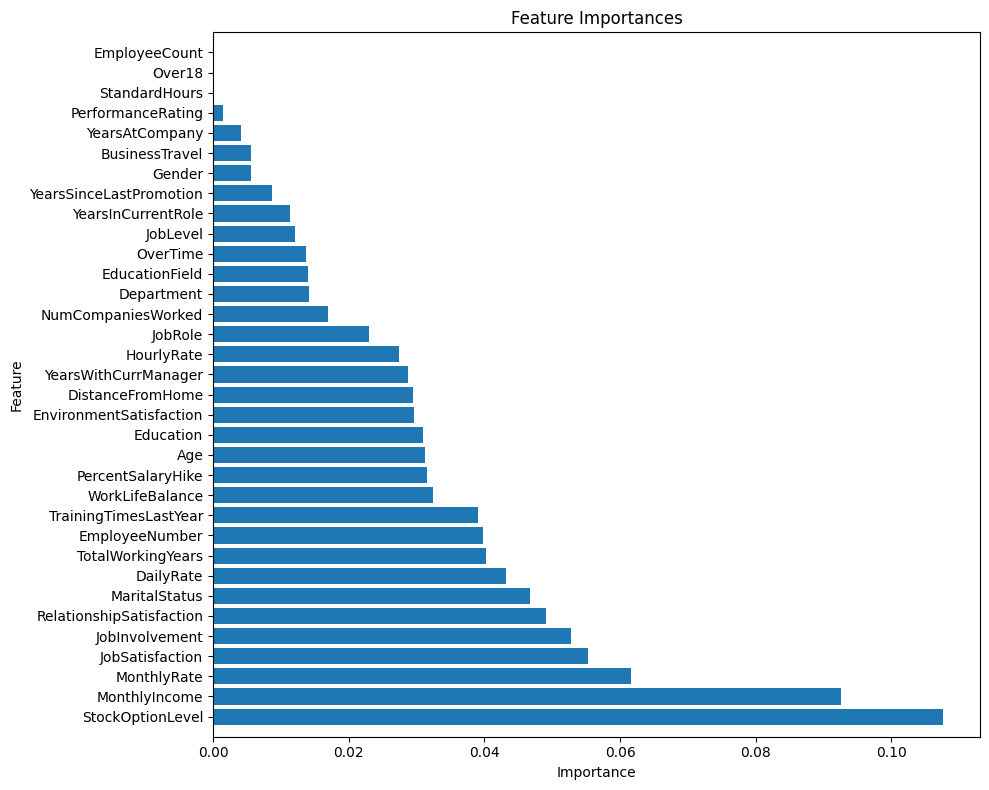

In [22]:
import matplotlib.pyplot as plt
import numpy as np

# Feature importance
importances = best_classifier.feature_importances_
indices = np.argsort(importances)[::-1]
feature_names = X.columns

# Plot the feature importances
plt.figure(figsize=(10, 8))
plt.title("Feature Importances")
plt.barh(range(X.shape[1]), importances[indices], align='center')
plt.yticks(range(X.shape[1]), feature_names[indices])
plt.ylim([-1, X.shape[1]])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

The feature importance plot provides a visual representation of how much each feature contributed to the decision-making process of the decision tree classifier. In a decision tree, feature importance is a measure of the impact of each feature in predicting the target variable (in this case, employee attrition).

#### Key Points from the Plot:
1. **StockOptionLevel:** This feature has the highest importance, indicating it is the most significant predictor for employee attrition in your dataset. Employees with different stock option levels might have varying likelihoods of leaving the company.

2. **MonthlyIncome:** This feature is also highly important. It suggests that employees' monthly income plays a crucial role in predicting whether they will stay or leave.

3. **JobSatisfaction:** Job satisfaction is another key predictor, highlighting that employees' satisfaction with their jobs significantly impacts their decision to stay or leave.

4. **JobInvolvement:** The level of an employee's involvement in their job is also an important factor in predicting attrition.

5. **RelationshipSatisfaction:** Satisfaction with workplace relationships affects the likelihood of employee attrition.

#### Practical Use: 

* **HR Focus Areas:**   HR departments can focus on improving conditions related to the top features (e.g., offering better stock options, competitive monthly income, and enhancing job satisfaction) to reduce attrition rates.

* **Feature Engineering:** Consider creating new features or refining existing ones based on the insights gained from feature importance to improve the model further.

* **Resource Allocation:** Allocate resources and efforts to address the key areas identified as the most significant predictors of attrition.

## Step 3c: Analyze The confusion Matrix and ROC Curve of the Decision Tree. 

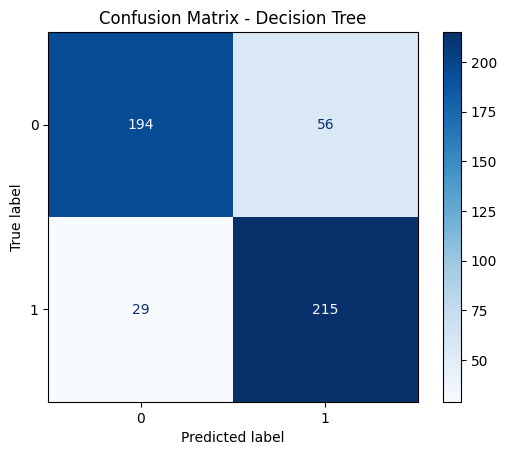

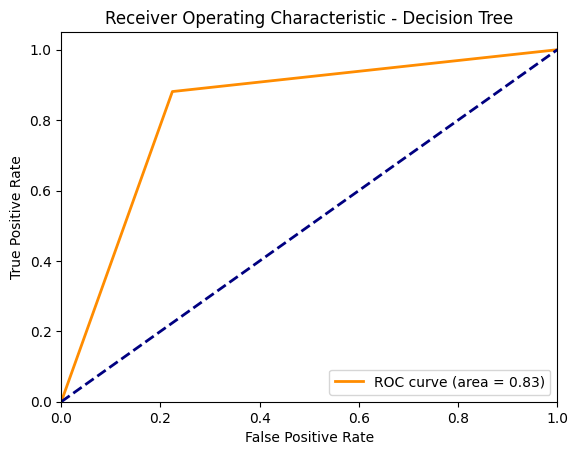

In [9]:
# Predict on the test set
y_pred = best_classifier.predict(X_test)

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_classifier.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix - Decision Tree")
plt.show()

# ROC Curve and AUC
y_prob = best_classifier.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Decision Tree')
plt.legend(loc="lower right")
plt.show()

#### **Results Analysis:**

* **Confusion Matrix:** From the confusion matrix, we can observe a pretty balanced, true-true prediction estimates, but also of note, that the false-positives and false-negatives are rather similar as well. This shows that while not perfect, there is still strong accuracy and recall for this method in a well balanced way. If false-negative would have been much larger than false-positives, we might infer that there is still strong class imbalance affecting the model. 

* **ROC Curve:** An alright ROC curve, however, we would like to see a higher True Positive Rate for a False Positive Rate between 0.0 and 0.2. 

## Step 4:  Comparing Accuracy, Precision to Other Popular Methods

#### Other classification methods to compare:

- Decision Tree (with no added SMOTE or hyperparamter tuning methods)
- Random Forest
- Logistic Regression
- Gradient Boosting

In [16]:
# Load the DataFrame
file_path = '/Users/keagandolphin/Desktop/HR-Data.csv'
df = pd.read_csv(file_path)

# Reapply the encoding mappings
encoding_mappings = {
    'Attrition': {'No': 0, 'Yes': 1},
    'BusinessTravel': {'Non-Travel': 0, 'Travel_Rarely': 1, 'Travel_Frequently': 2},
    'Department': {'Sales': 1, 'Research & Development': 2, 'Human Resources': 3},
    'EducationField': {'Human Resources': 1, 'Life Sciences': 2, 'Marketing': 3, 'Medical': 4, 'Other': 5, 'Technical Degree': 6},
    'Gender': {'Male': 1, 'Female': 2},
    'JobRole': {
        'Healthcare Representative': 1, 'Human Resources': 2, 'Laboratory Technician': 3, 'Manager': 4,
        'Manufacturing Director': 5, 'Research Director': 6, 'Research Scientist': 7,
        'Sales Executive': 8, 'Sales Representative': 9
    },
    'MaritalStatus': {'Single': 1, 'Married': 2, 'Divorced': 3},
    'Over18': {'N': 0, 'Y': 1},
    'OverTime': {'No': 0, 'Yes': 1}
}

for column, mapping in encoding_mappings.items():
    df[column] = df[column].map(mapping)

# Prepare the data
X = df.drop('Attrition', axis=1)
y = df['Attrition']

# Apply SMOTE
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X, y)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.2, random_state=42)

# Initialize models
models = {
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42),
    "Logistic Regression": LogisticRegression(max_iter=1000, random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42)
}

# Train and evaluate models
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    print(f"--- {name} ---")
    print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")
    print("Classification Report:")
    print(classification_report(y_test, y_pred))

# Ensemble method: Voting Classifier
voting_clf = VotingClassifier(estimators=[
    ('dt', models["Decision Tree"]),
    ('rf', models["Random Forest"]),
    ('lr', models["Logistic Regression"]),
    ('gb', models["Gradient Boosting"])
], voting='soft')

voting_clf.fit(X_train, y_train)
y_pred_voting = voting_clf.predict(X_test)

print("--- Voting Classifier ---")
print(f"Accuracy: {accuracy_score(y_test, y_pred_voting):.2f}")
print("Classification Report:")
print(classification_report(y_test, y_pred_voting))


--- Decision Tree ---
Accuracy: 0.79
Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.72      0.78       250
           1       0.75      0.87      0.81       244

    accuracy                           0.79       494
   macro avg       0.80      0.79      0.79       494
weighted avg       0.80      0.79      0.79       494

--- Random Forest ---
Accuracy: 0.92
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.93      0.92       250
           1       0.93      0.91      0.92       244

    accuracy                           0.92       494
   macro avg       0.92      0.92      0.92       494
weighted avg       0.92      0.92      0.92       494



/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


--- Logistic Regression ---
Accuracy: 0.79
Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.77      0.78       250
           1       0.77      0.80      0.79       244

    accuracy                           0.79       494
   macro avg       0.79      0.79      0.79       494
weighted avg       0.79      0.79      0.79       494

--- Gradient Boosting ---
Accuracy: 0.90
Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.93      0.91       250
           1       0.93      0.88      0.90       244

    accuracy                           0.90       494
   macro avg       0.91      0.90      0.90       494
weighted avg       0.91      0.90      0.90       494



/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


--- Voting Classifier ---
Accuracy: 0.90
Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.90      0.90       250
           1       0.89      0.90      0.90       244

    accuracy                           0.90       494
   macro avg       0.90      0.90      0.90       494
weighted avg       0.90      0.90      0.90       494



###  **Results Analysis:**

| Model                | Accuracy | Class | Precision | Recall | F1-Score |
|----------------------|----------|-------|-----------|--------|----------|
| **Decision Tree**    | 0.79     | 0     | 0.85      | 0.72   | 0.78     |
|                      |          | 1     | 0.75      | 0.87   | 0.81     |
|                      |          | Macro Avg | 0.80  | 0.79   | 0.79     |
|                      |          | Weighted Avg | 0.80 | 0.79 | 0.79     |
| **Random Forest**    | 0.92     | 0     | 0.92      | 0.93   | 0.92     |
|                      |          | 1     | 0.93      | 0.91   | 0.92     |
|                      |          | Macro Avg | 0.92  | 0.92   | 0.92     |
|                      |          | Weighted Avg | 0.92 | 0.92 | 0.92     |
| **Logistic Regression** | 0.79  | 0     | 0.80      | 0.77   | 0.78     |
|                      |          | 1     | 0.77      | 0.80   | 0.79     |
|                      |          | Macro Avg | 0.79  | 0.79   | 0.79     |
|                      |          | Weighted Avg | 0.79 | 0.79 | 0.79     |
| **Gradient Boosting** | 0.90    | 0     | 0.89      | 0.93   | 0.91     |
|                      |          | 1     | 0.93      | 0.88   | 0.90     |
|                      |          | Macro Avg | 0.91  | 0.90   | 0.90     |
|                      |          | Weighted Avg | 0.91 | 0.90 | 0.90     |
| **Voting Classifier** | 0.90    | 0     | 0.90      | 0.90   | 0.90     |
|                      |          | 1     | 0.89      | 0.90   | 0.90     |
|                      |          | Macro Avg | 0.90  | 0.90   | 0.90     |
|                      |          | Weighted Avg | 0.90 | 0.90 | 0.90     |



### **Highlights**

**Random Forest:**

Highest accuracy at 0.92.
Excellent precision, recall, and F1-score for both classes (around 0.92).

**Gradient Boosting:**

High accuracy at 0.90.
Very good precision, recall, and F1-score for both classes (around 0.90-0.91).

**Voting Classifier:**

High accuracy at 0.90.
Consistent precision, recall, and F1-score for both classes (around 0.90).

**Decision Tree:**

Moderate accuracy at 0.79.
Class 0 has higher precision but lower recall compared to Class 1.

**Logistic Regression:**

Moderate accuracy at 0.79.
Balanced precision, recall, and F1-score for both classes (around 0.77-0.80).

**Summary:**

* Random Forest and Gradient Boosting are the best performing models with the highest accuracy and balanced performance metrics.
* Voting Classifier also performs well.
* Decision Tree and Logistic Regression have lower accuracy but still provide a reasonable balance of precision, recall, and F1-score.

## Step 5: Random Forest Classifier

- Since the RandomForest Classifier turned out to have a **higher accuracy, precision, recall, and F1-score** than the first decision tree (with SMOTE and hyperparameter tuning), we are going to expand on it's capabilites and produce a feature importance chart, confusion matrix, and ROC curve to compare to our decision tree model. 

--- Random Forest ---
Accuracy: 0.92
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.93      0.92       250
           1       0.93      0.91      0.92       244

    accuracy                           0.92       494
   macro avg       0.92      0.92      0.92       494
weighted avg       0.92      0.92      0.92       494



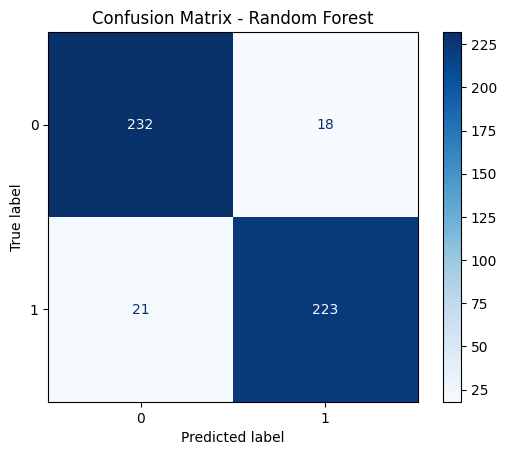

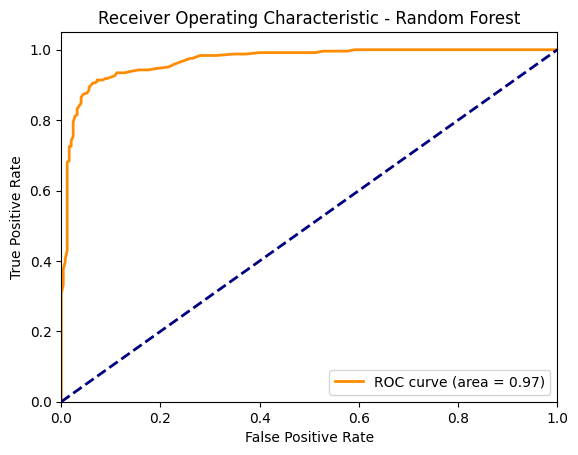

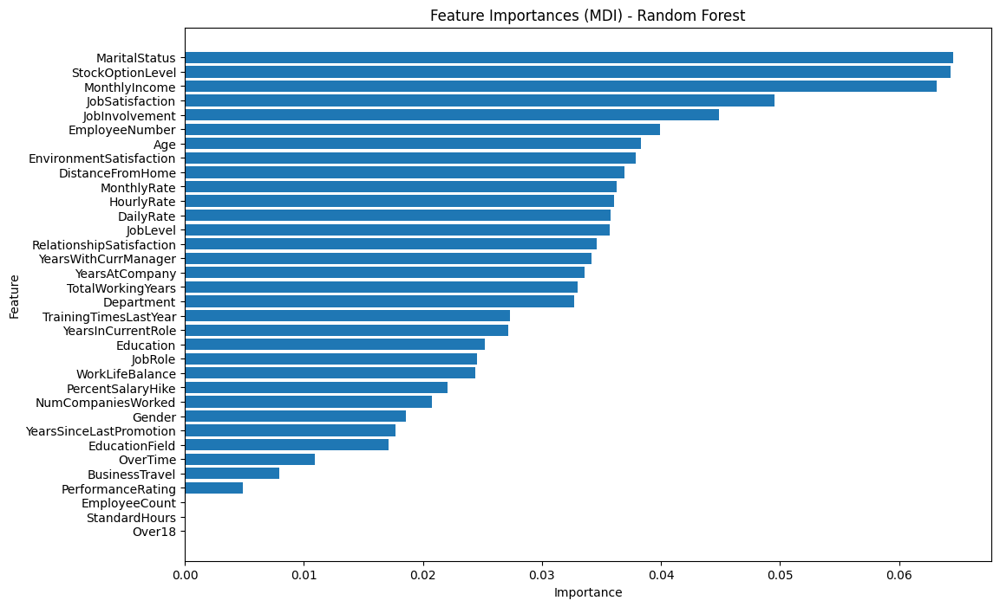

In [19]:
# Load the DataFrame
file_path = '/Users/keagandolphin/Desktop/HR-Data.csv'
df = pd.read_csv(file_path)

# Reapply the encoding mappings
encoding_mappings = {
    'Attrition': {'No': 0, 'Yes': 1},
    'BusinessTravel': {'Non-Travel': 0, 'Travel_Rarely': 1, 'Travel_Frequently': 2},
    'Department': {'Sales': 1, 'Research & Development': 2, 'Human Resources': 3},
    'EducationField': {'Human Resources': 1, 'Life Sciences': 2, 'Marketing': 3, 'Medical': 4, 'Other': 5, 'Technical Degree': 6},
    'Gender': {'Male': 1, 'Female': 2},
    'JobRole': {
        'Healthcare Representative': 1, 'Human Resources': 2, 'Laboratory Technician': 3, 'Manager': 4,
        'Manufacturing Director': 5, 'Research Director': 6, 'Research Scientist': 7,
        'Sales Executive': 8, 'Sales Representative': 9
    },
    'MaritalStatus': {'Single': 1, 'Married': 2, 'Divorced': 3},
    'Over18': {'N': 0, 'Y': 1},
    'OverTime': {'No': 0, 'Yes': 1}
}

for column, mapping in encoding_mappings.items():
    df[column] = df[column].map(mapping)

# Prepare the data
X = df.drop('Attrition', axis=1)
y = df['Attrition']

# Apply SMOTE
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X, y)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.2, random_state=42)

# Train the Random Forest classifier
rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X_train, y_train)

# Predict on the test set
y_pred_rf = rf_classifier.predict(X_test)

# Print accuracy and classification report
print(f"--- Random Forest ---")
print(f"Accuracy: {accuracy_score(y_test, y_pred_rf):.2f}")
print("Classification Report:")
print(classification_report(y_test, y_pred_rf))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred_rf)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=rf_classifier.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix - Random Forest")
plt.show()

# ROC Curve and AUC
y_prob_rf = rf_classifier.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob_rf)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Random Forest')
plt.legend(loc="lower right")
plt.show()

# View feature importances
feature_importances = rf_classifier.feature_importances_

# Create a DataFrame for visualization
feature_importances_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
})

# Sort the DataFrame by importance
feature_importances_df = feature_importances_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
plt.barh(feature_importances_df['Feature'], feature_importances_df['Importance'])
plt.gca().invert_yaxis()
plt.title('Feature Importances (MDI) - Random Forest')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

## Step 4b: Vizualizing one of the Random Tress using GraphViz

- Visualizing a single decision tree within a Random Forest can help understand how the ensemble model makes decisions. However, it is important to note that a Random Forest consists of many decision trees, and visualizing all of them might not be practical. But, we can visualize at least one of the trees from the Random Forest.

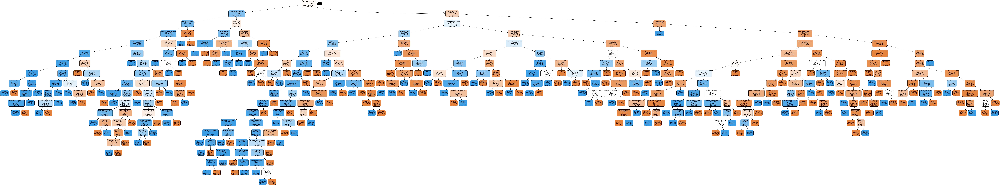

In [34]:
# Load the DataFrame
file_path = '/Users/keagandolphin/Desktop/HR-Data.csv'
df = pd.read_csv(file_path)

# Reapply the encoding mappings
encoding_mappings = {
    'Attrition': {'No': 0, 'Yes': 1},
    'BusinessTravel': {'Non-Travel': 0, 'Travel_Rarely': 1, 'Travel_Frequently': 2},
    'Department': {'Sales': 1, 'Research & Development': 2, 'Human Resources': 3},
    'EducationField': {'Human Resources': 1, 'Life Sciences': 2, 'Marketing': 3, 'Medical': 4, 'Other': 5, 'Technical Degree': 6},
    'Gender': {'Male': 1, 'Female': 2},
    'JobRole': {
        'Healthcare Representative': 1, 'Human Resources': 2, 'Laboratory Technician': 3, 'Manager': 4,
        'Manufacturing Director': 5, 'Research Director': 6, 'Research Scientist': 7,
        'Sales Executive': 8, 'Sales Representative': 9
    },
    'MaritalStatus': {'Single': 1, 'Married': 2, 'Divorced': 3},
    'Over18': {'N': 0, 'Y': 1},
    'OverTime': {'No': 0, 'Yes': 1}
}

for column, mapping in encoding_mappings.items():
    df[column] = df[column].map(mapping)

# Prepare the data
X = df.drop('Attrition', axis=1)
y = df['Attrition']

# Apply SMOTE
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X, y)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.2, random_state=42)

# Train the Random Forest classifier
rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X_train, y_train)

# Extract one tree from the forest
tree = rf_classifier.estimators_[0]

# Export the tree to a DOT format
dot_data = export_graphviz(tree, out_file=None, 
                           feature_names=X.columns,  
                           class_names=['No', 'Yes'],  
                           filled=True, rounded=True,  
                           special_characters=True)  

# Create a graph from DOT data
graph = pydotplus.graph_from_dot_data(dot_data)  

# Display the graph
Image(graph.create_png())

_______________________________________________________________________________________________________________

## Conclusions

Performance Comparison:
| Metric            | Decision Tree (Class 0) | Decision Tree (Class 1) | Random Forest (Class 0) | Random Forest (Class 1) |
|-------------------|--------------------------|--------------------------|-------------------------|-------------------------|
| **Accuracy**      | 90%                      |                          | 92%                     |                         |
| **Precision**     | 0.89                     | 0.93                     | 0.92                    | 0.93                    |
| **Recall**        | 0.93                     | 0.88                     | 0.93                    | 0.91                    |
| **F1-Score**      | 0.91                     | 0.90                     | 0.92                    | 0.92                    |


### **Analysis:** ###

* The Random Forest model has higher accuracy, precision, recall, and F1-scores for both classes compared to the Decision Tree model.
Random Forest generally outperforms Decision Trees in terms of predictive power due to its ensemble nature, which reduces overfitting.

### Pros and Cons of Each Model: ###

#### **Decision Tree:**
Pros:

* **Simplicity and Interpretability:** Easy to understand and interpret, which is useful for explaining the model to non-technical stakeholders.
* **Visualization:** Can be easily visualized, making it straightforward to understand how decisions are made.
* **Less Computationally Intensive:** Requires less computational power and memory compared to Random Forests, making it faster to train and predict.

Cons:

* **Overfitting:** Prone to overfitting, especially if the tree is deep. Overfitting can be mitigated with techniques like pruning.
* **Variance:** High variance due to being sensitive to the specific data it is trained on.

#### **Random Forest:**
Pros:

* **Higher Accuracy:** Typically provides better accuracy and generalization than a single decision tree by aggregating the predictions of multiple trees.
* **Reduced Overfitting:** Less prone to overfitting due to averaging multiple decision trees.
* **Robustness:** More robust to noise and outliers due to the ensemble method.

Cons:

* **Complexity and Interpretability:** Harder to interpret than a single decision tree. Individual trees in the forest can be visualized, but the overall model's decision process is less transparent.
* **Computationally Intensive:** Requires more computational resources and time to train and predict due to the use of multiple trees.

### Summary: 

- **Random Forest:** Best for higher accuracy and robustness, especially if you can afford the computational cost and need a model that generalizes well.
- **Decision Tree:** Best for interpretability and simplicity, especially if computational resources are limited and a slightly lower accuracy is acceptable.
